# Practical work on graph-cut optimization (part 2, multilevel)

The objective of this PW is the implementation of the $\alpha$-expansion and $\alpha$-$\beta$ swap approaches for grayscale image denoising.

The PyMaxFlow library is used to compute the graph-cut.

In [23]:
import math
import random
import numpy as np
from numpy import log
#%matplotlib notebook
import matplotlib.pyplot as plt

import platform
import tempfile
import os
from scipy import ndimage as ndi
try:
    import maxflow
except:
    !pip install PyMaxflow  # For Google Collab
    import maxflow
from maxflow.fastmin import aexpansion_grid, abswap_grid

from skimage import io
import imageio.v2 as imageio
from skimage.morphology import binary_dilation, disk
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.models.mappers import LogColorMapper, LinearColorMapper
from bokeh.io import output_notebook
output_notebook()


def affiche_pour_colab(im,MINI=None, MAXI=None,titre=''): #special colab, don't look
  def normalise_image_pour_bokeh(X,MINI,MAXI):
    if MAXI==None:
      MAXI = np.max(X)
    if MINI==None:
      MINI = np.min(X)
    imt=np.copy(X.copy())
    imt = np.clip((imt - MINI) / (MAXI-MINI), 0, 1)
    imt*=255
    sortie=np.empty((*imt.shape,4),dtype=np.uint8)
    for k in range(3):
      sortie[:,:,k]=imt
    sortie[:,:,3]=255
    return sortie

  if (MINI is not None) and (MAXI is not None):
    img=normalise_image_pour_bokeh(im,MINI,MAXI)
    vmin, vmax = 0., 255.
  else:
    img = im[..., np.newaxis]
    vmin, vmax = np.min(img), np.max(img)
  p = figure(tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")], y_range=[im.shape[0], 0], x_range=[0, im.shape[1]], title=titre)
  p.image(image=[img[:, :, 0]], x=0, y=0, dw=im.shape[1], dh=im.shape[0], color_mapper=LinearColorMapper(palette="Greys256", low=vmin, high=vmax))
  p.xgrid.visible = False
  p.ygrid.visible = False
  showbokeh(p)


def affiche(im,MINI=0.0, MAXI=None,titre='',printname=False):
  affiche_pour_colab(im,MINI=MINI, MAXI=MAXI,titre=titre) # Under Google Colab, many options disappear


def display_segmentation_borders(image, bin):
  imagergb = np.copy(image)
  contour = binary_dilation(bin,disk(15))^bin
  imagergb[contour==1,0] = 255
  imagergb[contour==1,1] = 0
  imagergb[contour==1,2] = 0
  return imagergb

## 2 Denoising a grayscale image


In this second part of the PW, we are interested in using Markovian methods to **denoise** images with different regularization potentials.

We are interested in denoising the images *Ibruitee.png* and *Ibruitee2.png* which correspond to the same scene perturbed by two noises of different nature.


We will complete programs that call the algorithm of alpha-expansions or Boykov's alpha-beta swap according to the Kolmogorov technique.


Q1: What are the respective expressions for the data attachment potentials in the case of noise following a Gaussian distribution (equation 1) and a Rayleigh distribution (equation 2)?

\begin{equation}
p(y_p|x_p)=\frac{1}{\sqrt{2\pi}\sigma}\exp\left[-\frac{(y_p-x_p)^2}{2\sigma^2}\right],
\end{equation}

\begin{equation}
p(y_p|x_p)=2\frac{y_p}{x_p^2}\exp\left[-\frac{y_p^2}{x_p^2}\right].
\end{equation}

**Your answer &#x270D;**

A1:
Data Attachment Potentials

Gaussian Noise:  
$
D(y_p| x_p) = \frac{(y_p - x_p)^2}{2\sigma^2}
$

Rayleigh Noise:  
$
D(y_p| x_p) = -log(2\frac{y_p}{x_p^2}e^{-\frac{y_p^2}{x_p^2}})\approx\frac{y_p^2}{x_p^2} + 2 \log x_p
$


Q2: By studying the histogram of a homogeneous area, indicate which type of noise is present in which image.  



**Your answer &#x270D;**

A2: The histogram of a homogeneous region is similar to a Gaussian distribution for the first picture. However the histogram of the second one is similar to a Rayleigh distribution.

In [24]:
im_obs=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee.png').astype('float') # Observed image, noisy
im_obs2=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee2.png').astype('float') # Observed image, noisy
im_orig=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/IoriginaleBW.png').astype('float') # Reference binary image, to evaluate the quality of the segmentation

I = im_obs
affiche(im_obs,MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)

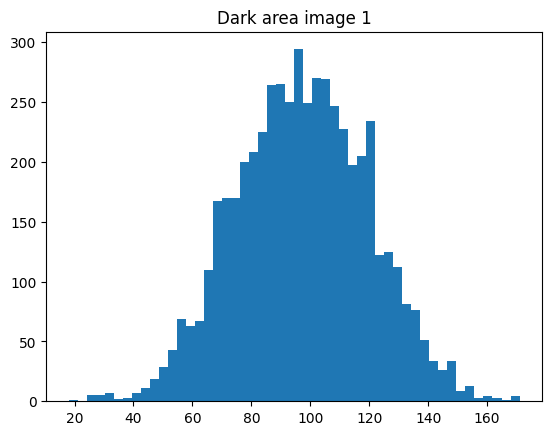

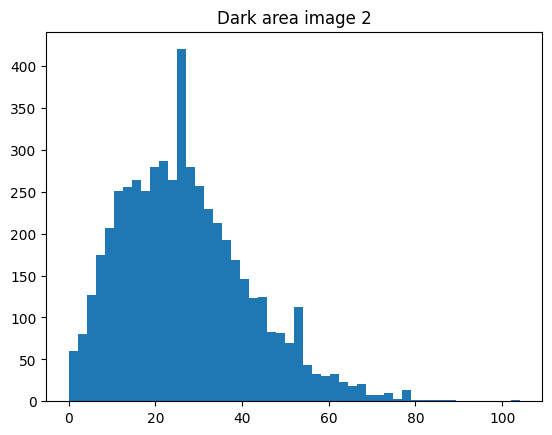

In [25]:
# select a homogeneous area to study the histogram
# we can use the area from 45 to 120 on vertical axis and from 175 to 245 on
# horizontal one
ymin, ymax, xmin, xmax =45, 120, 175, 245

affiche(im_obs[ymin:ymax, xmin:xmax],MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)
plt.figure()
plt.hist(im_obs[ymin:ymax, xmin:xmax].flatten(),50)
plt.title('Dark area image 1')
plt.show()

affiche(im_obs2[ymin:ymax, xmin:xmax],MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)
plt.figure()
plt.hist(im_obs2[ymin:ymax, xmin:xmax].flatten(),50)
plt.title('Dark area image 2')
plt.show()


We will compare three *a priori* models: the Potts model $\delta_{x_p=x_q}$, the (discrete) total variation $|x_p-x_q|$, and the (quadratic) Gaussian model $(x_p-x_q)^2$.

Q3: Are they metrics or semi-metrics? What can we deduce about the optimization method to use?

**Your answer &#x270D;**

A3:
- **Potts Model** $ \delta_{x_p = x_q} $: Not a metric (does not satisfy triangle inequality).  
- **Total Variation** $ |x_p - x_q| $: Metric (satisfies all properties).  
- **Gaussian Model** $ (x_p - x_q)^2 $: Semi-metric (violates triangle inequality).  

The models with a semi-metric potential can be used for the $\alpha$-$\beta$ swap, while the models with a metric potential can be used for both the $\alpha$-extension and the $\alpha$-$\beta$ swap.


Q4: What are the differences between the $\alpha$-expansion method and the $\alpha$-$\beta$ swap method?

**Your answer &#x270D;**

A4: The $\alpha$-$\beta$ swap involves swapping labels between two neighboring regions, typically used in segmentation tasks. It optimizes the energy by exchanging values of neighboring nodes.

The $\alpha$-extension allows for the addition of a new label ($\alpha$) to the set of possible labels, thus extending the label space and often improving flexibility in energy minimization.

In the following sections we will use the functions **aexpansion_grid** and **abswap_grid** which perform the $\alpha$-expansion and $\alpha$-$\beta$ swap respectively. These functions take as input two arguments for a number of levels L :
- a tensor of the image size containing in the 3rd dimension the data attachment of each pixel for each considered level (unary term, $\texttt{D}$ in the following)
- a matrix containing the values of the interaction terms between two levels $l_1$ and $l_2$ (depends on the chosen interaction potential, $\texttt{V...}$ in the following)

### 2.1 Denoising in the Gaussian case (synthetic image)

In [26]:
# Loading images
im_obs=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee.png').astype('float') # Observed image, noisy
im_orig=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/IoriginaleBW.png').astype('float') # Reference binary image, to evaluate the quality of the segmentation

I = im_obs

I = I*255/I.max()
L = 30
# Generates L gray levels for nearsest prototype labeling
levs = np.arange(1/L, 255, 255/L)
# Calculate data cost as the absolute difference between the label prototype and the pixel value
d = np.double(I.reshape(I.shape+(1,)) - levs.reshape((1,1,-1)))
D = np.abs(d) # Complete to compute data attachment potential map from
affiche(I,MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)

# Generate nearest prototype labeling
Id = np.argmin(D,2)
affiche(Id*255/L,MINI=0.0, MAXI=255.,titre="Maximum likelihood denoising",printname=True)

print("Shape of D:", D.shape)

Shape of D: (323, 361, 30)


Q5: Here, what does the array $\texttt{d}$ correspond to? Explain its dimension.

From this array $\texttt{d}$, compute (in the code) the data attachment potential map $\texttt{D}$ for the considered noise.

**Your answer &#x270D;**

A5: The array $\texttt{d}$ represents the differences between pixel values in the noisy image (`im_obs`) and the prototype gray levels (`levs`). It's the data attachment term. Dimension of $\texttt{d}$: (height, width, L), where L is the number of gray levels (30 in this case).


Complete the programs below, and test each regularization model by determining an appropriate beta value each time and an appropriate multi-label graph-cut algorithm.

*Note:* in order to test several values of $\beta$, it is suggested to **crop your image** to 100x100 pixels for example.

In [27]:
# Potts model regularization
# beta values of the order of hundreds/thousands
beta_Potts = 20.

# definition of the regularization matrix V(i,j) for the Potts model

# HINT1
# Map of the difference between two classes (difference class to class):
d_c2c = levs.reshape((-1,1)) - levs.reshape((1,-1))
print("Shape of d_c2c:", d_c2c.shape)
# If the regularization potential Vc(x1, x2) of a model is f(x1 - x2), then you
# must define : V_model = f(d_c2c)

# HINT2
# For Potts model, comparing two values is equivalent to compare to difference
# of these two values to some other value...
V_Potts= beta_Potts * np.double(np.abs(d_c2c) > 0)
print("Shape of V_Potts:", V_Potts.shape)
affiche(V_Potts)

# Performs aexpansion_grid or abswap_grid based on the data attachment D and the regularization V
labels_Potts = abswap_grid(np.double(D), V_Potts)
affiche(labels_Potts*255.0/L,MINI=0.0, MAXI=255.0,titre="Graph Cut Denoising, Potts regularization, beta = " + str(beta_Potts),printname=True)

Shape of d_c2c: (30, 30)
Shape of V_Potts: (30, 30)


In [28]:
# TV model regularization
# beta value of the order of tens
beta_TV =1.
# definition of the regularization matrix V(i,j) for the TV model
V_TV = beta_TV * np.double(np.abs(d_c2c))
affiche(V_TV)

# Performs aexpansion_grid or abswap_grid based on the data attachment D and the regularization V
labels_TV =aexpansion_grid(np.double(D), V_TV)
affiche(labels_TV*255.0/L,MINI=0.0, MAXI=255.0,titre="Graph Cut Denoising, TV regularization, beta = " + str(beta_TV),printname=True)

In [29]:
# Quadratic model regularization
# beta value of the order of tens
beta_quadratic =0.08

# definition of the regularization matrix V(i,j) for the quadratic model
V_quadratic = beta_quadratic * np.double(d_c2c**2)
affiche(V_quadratic)

# Performs aexpansion_grid or abswap_grid based on the data attachment D and the regularization V
labels_Quadratic = abswap_grid(np.double(D), V_quadratic)
affiche(labels_Quadratic*255.0/L,MINI=0.0, MAXI=255,titre="Graph Cut Denoising, Quadratic regularization, beta = " + str(beta_quadratic),printname=True)

Q6: Which regularization model do you think is best? Give the best regularization parameter visually found and comment on the results you get in each of the three cases.

**Your answer &#x270D;**

A6: If the goal is to completely remove noise, the Total Variation model is better; however, it results in large patches. To avoid patches while retaining some noise, the Potts model is more effective.

### 2.2 Denoising in the case of speckle noise (synthetic image)

Modify the following cells to fit the model for denoising the im_obs2 image.

Q7: Which modifications are needed? (There are several!)

**Your answer &#x270D;**

A7: The data attachment potential **D** is derived from the negative log-likelihood of the Rayleigh distribution:

$
D(y_p, x_p) = -\log \left( 2 \frac{y_p}{x_p^2} \exp\left(-\frac{y_p^2}{x_p^2}\right) \right)
$

This ensures that lower values correspond to more probable intensity-label assignments.



In [30]:
from maxflow.fastmin import aexpansion_grid
from numpy import log

# Loading image
im_obs2=io.imread('https://perso.telecom-paristech.fr/tupin/TPGRAPHCUT/OLD/Ibruitee2.png').astype('float') # Observed image, noisy
I = im_obs2
I = I*255/I.max()
affiche(I,MINI=0.0, MAXI=255.,titre="Noisy image 2",printname=True)

L = 30
# Generates L gray levels for nearsest prototype labeling
levs = np.arange(1/L, 255, 255/L)

# Calculate data cost as the absolute difference between the label prototype and the pixel value

# HINT:
# The following computes the ratio between the data value and a class value for
# each class [ys / xs], and you can put a square one only one or both terms.
ratio = I.reshape(I.shape+(1,)) / levs.reshape((1,1,-1))

D =  -np.log(2 * (ratio / levs.reshape((1,1,-1))) * np.exp(-ratio**2)) # Complete data attachment potential map following Rayleigh distribution
Id = np.argmin(D,2)

# Generate nearest prototype labeling
Id = np.argmin(D,2)
affiche(Id/L*255,MINI=0.0, MAXI=255.,titre="Maximum likelihood denoising",printname=True)

<ipython-input-30-6c2e4884bd96>:21: RuntimeWarning: divide by zero encountered in log
  D =  -np.log(2 * (ratio / levs.reshape((1,1,-1))) * np.exp(-ratio**2)) # Complete data attachment potential map following Rayleigh distribution


In [31]:
# beta value in the order of tenths of a unit
beta_Potts =0.5
# definition of the Potts potential matrix
V_Potts = beta_Potts * np.double(np.abs(d_c2c) > 0)

# Performs aexpansion_grid or abswap_grid based on the data attachment D and the regularization V
labels_Potts = abswap_grid(np.double(D), V_Potts)
affiche(labels_Potts*255.0/L,MINI=0.0, MAXI=None,titre="Graph Cut Denoising, Potts regularization, beta = " + str(beta_Potts),printname=True)

In [32]:
# beta value in hundredths of a unit
beta_TV =0.02
# definition of the regularization matrix for TV
V_TV = beta_TV * np.double(np.abs(d_c2c))

# Performs aexpansion_grid or abswap_grid based on the data attachment D and the regularization V
labels_TV = aexpansion_grid(np.double(D), V_TV)
affiche(labels_TV*255.0/L,MINI=0.0, MAXI=None,titre="Graph Cut Denoising, TV regularization, beta = " + str(beta_TV),printname=True)

In [33]:
# beta value in the order of thousandths of a unit
beta_quadratic = 0.002
# definition of the regularization matrix for a quadratic potential
V_quadratic = beta_quadratic * np.double(d_c2c**2)

# Performs aexpansion_grid or abswap_grid based on the data attachment D and the regularization V
labels_Quadratic = aexpansion_grid(np.double(D), V_quadratic)
affiche(labels_Quadratic*255.0/L,MINI=0.0, MAXI=None,titre="Graph Cut Denoising, Quadratic regularization, beta = " + str(beta_quadratic),printname=True)

### 2.3 Denoising a natural image

Apply one of the methods used above to denoise the noisy cameraman image. Justify your choice.

*Note:* you should check how the noise is generated to choose your data attachment term.

Q8: Comment on the result obtained.

**Your answer &#x270D;**

A8: We have Gaussian noise, so it seems better to use the same distribution for our model. Moreover, the Total Variation model appears to be more suitable for denoising. However, the obtained patches give an unconvincing result. With the Potts model, we get a less blurry result but still with some noise.

In [34]:
I_cameraman = imageio.imread('https://people.math.sc.edu/Burkardt/data/tif/cameraman.tif')
I_cameraman_bruit = I_cameraman + np.random.normal(0,80,I_cameraman.shape)
I_cameraman_bruit[I_cameraman_bruit<0] = 0
I_cameraman_bruit[I_cameraman_bruit>255] = 255

affiche(I_cameraman, MINI=0.0, MAXI=255,titre="Image without noise",printname=True)
affiche(I_cameraman_bruit, MINI=0.0, MAXI=255,titre="Noisy image",printname=True)

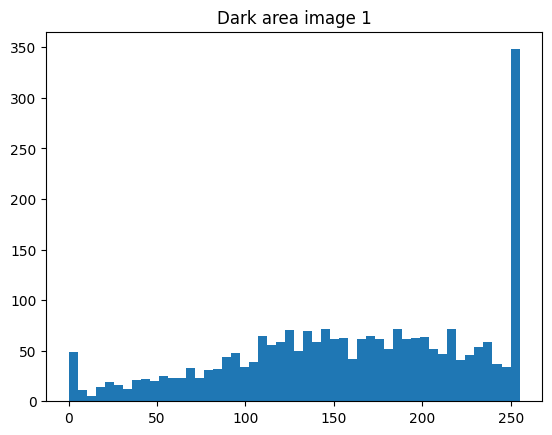

In [35]:
ymin, ymax, xmin, xmax =0, 50, 0, 50
affiche(I_cameraman_bruit[ymin:ymax, xmin:xmax],MINI=0.0, MAXI=255.,titre="Noisy image",printname=True)
plt.figure()
plt.hist(I_cameraman_bruit[ymin:ymax, xmin:xmax].flatten(),50)
plt.title('Dark area image 1')
plt.show()

In [36]:
I = 255*I_cameraman_bruit/I.max()
L = 250
beta_Potts=50
# Generates L gray levels for nearsest prototype labeling
levs = np.arange(1/L, 255, 255/L)
# Calculate data cost as the absolute difference between the label prototype and the pixel value
D = np.abs(I.reshape(I.shape+(1,)) - levs.reshape((1,1,-1)))
d_c2c = levs.reshape((-1,1)) - levs.reshape((1,-1))

# choose a regularization model and compute V matrix
V_Potts= beta_Potts * np.double(np.abs(d_c2c)>0 )
print("Shape of V_Potts:", V_Potts.shape)
# compute the appropriate optimization
labels_Potts = aexpansion_grid(np.double(D), V_Potts)
# display the regularized image
affiche(labels_Potts*255.0/L,MINI=0.0, MAXI=255.0,titre="Graph Cut Denoising, Potts regularization, beta = " + str(beta_Potts),printname=True)

Shape of V_Potts: (250, 250)


### 2.3 SAR Image Denoising

SAR (Synthetic Aperture Radar) imagery is a radar-based remote sensing modality that provides images of the Earth in all light and weather conditions. A major drawback is the high speckle noise that affects them. The following cell loads an amplitude image acquired by the Sentinel 1-A satellite over the city of Des Moines in the USA. To limit the computation time, we will work on a small rectangle from the image provided.

Adapt one of the methods used previously to denoise the image provided. We will assume that the noise follows a Rayleigh distribution.

Q9: Comment on the result obtained.

We can compare the result with a denoising obtained by a more recent method (SAR2SAR), based on a Deep Learning approach (the code to display it is provided below).

**Your answer &#x270D;**

A9: The traditional denoising methods may not work well on SAR images due to the multiplicative nature of speckle noise, which follows a Rayleigh distribution, whereas these methods typically assume additive noise, making them less effective for this type of noise.

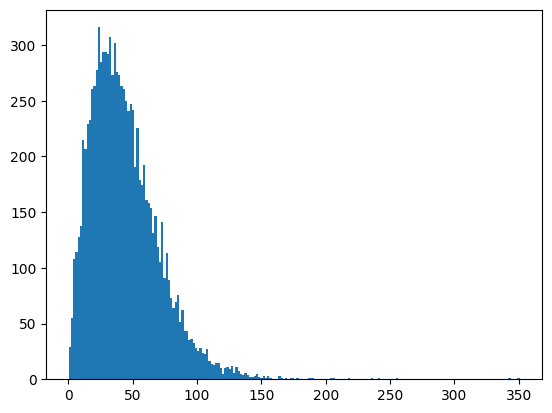

In [37]:
try:
    I_SAR = np.load('noisy_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1')
except:
    !wget 'https://www.dropbox.com/s/7m2dw3irho8dpzj/noisy_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1'
    I_SAR = np.load('noisy_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1')

affiche(I_SAR,MINI=0,MAXI=100, titre="Full SAR image denoised by SAR2SAR")
affiche(I_SAR[0:300,0:300],MINI=0,MAXI=100, titre="Cropped SAR image denoised by SAR2SAR")

I_SAR = I_SAR[0:300,0:300]
plt.figure()
plt.hist(I_SAR[100:200,100:200].flatten(),200) # Display of the histogram on an almost homogeneous area
plt.show()

In [38]:
I = I_SAR*255/I_SAR.max()
L = 250
beta_Potts=0.15
# Generates L gray levels for nearsest prototype labeling
levs =np.arange(1/L, 255, 255/L)
# Calculate data cost as the neg-log likelihood

d_c2c = levs.reshape((-1,1)) - levs.reshape((1,-1))
ratio = I.reshape(I.shape+(1,)) / levs.reshape((1,1,-1))

D =  -np.log(2 * (ratio / levs.reshape((1,1,-1))) * np.exp(-ratio**2)) # Complete data attachment potential map following Rayleigh distribution
# choose a regularization model and compute V matrix
V_Potts= beta_Potts * np.double(np.abs(d_c2c) )
print("Shape of V_Potts:", V_Potts.shape)
# compute the appropriate optimization
labels_Potts = aexpansion_grid(np.double(D), V_Potts)
affiche(labels_Potts/L*255,MINI=0.0, MAXI=None,titre="Maximum likelihood denoising",printname=True)

<ipython-input-38-103d73ddff9e>:11: RuntimeWarning: divide by zero encountered in log
  D =  -np.log(2 * (ratio / levs.reshape((1,1,-1))) * np.exp(-ratio**2)) # Complete data attachment potential map following Rayleigh distribution


Shape of V_Potts: (250, 250)


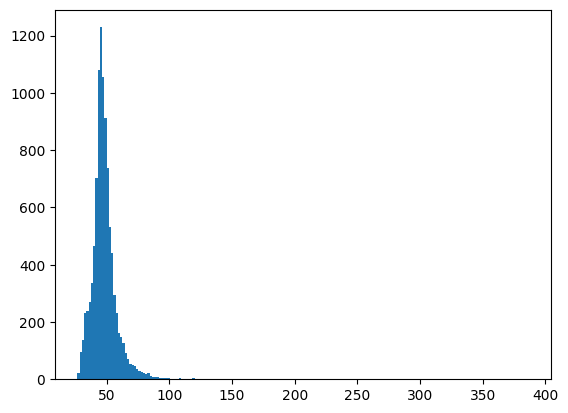

In [39]:
# Display of the denoised image by the SAR2SAR method

try:
    denoised_I_SAR = np.load('denoised_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1')
except:
    !wget 'https://www.dropbox.com/s/0f6l0qr6teck5bd/denoised_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1'
    denoised_I_SAR = np.load('denoised_DesMoines_dual_1_corrige_1_VV_AMPLITUDE.npy?dl=1')

affiche(denoised_I_SAR,MINI=0,MAXI=100, titre="Full SAR image denoised by SAR2SAR")
affiche(denoised_I_SAR[0:300,0:300],MINI=0,MAXI=100, titre="Cropped SAR image denoised by SAR2SAR")

plt.figure()
plt.hist(denoised_I_SAR[100:200,100:200].flatten(),200) # Display of the histogram on an almost homogeneous area
plt.show()